In [79]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly
from sklearn.preprocessing import StandardScaler
from scipy.spatial import distance
import copy
import warnings
from collections import Counter
warnings.filterwarnings("ignore")
plotly.offline.init_notebook_mode (connected = True)

In [2]:
data=pd.read_csv('Desktop/genres_v2.csv')

# Having First Look At The Data

The full list of genres included in the CSV are Trap, Techno, Techhouse, Trance, Psytrance, Dark Trap, DnB (drums and bass), Hardstyle, Underground Rap, Trap Metal, Emo, Rap, RnB, Pop and Hiphop.

In [3]:
data.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,...,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,...,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,...,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,...,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,...,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN


In [33]:
data.shape

(21519, 23)

In [207]:
data.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster,cluster_label
count,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.000000,21519.00000
mean,0.674583,0.657252,5.144942,-7.039576,0.583020,0.178072,0.167282,0.075957,0.195378,0.417385,151.480713,194521.728844,3.968539,4.356662,8.57038
std,0.159427,0.175719,3.693472,2.906579,0.493071,0.140648,0.208450,0.220703,0.151472,0.233708,29.137425,60376.433104,0.325633,2.622566,5.34082
min,0.065100,0.000243,0.000000,-33.357000,0.000000,0.022700,0.000001,0.000000,0.021000,0.020600,57.967000,38333.000000,1.000000,0.000000,0.00000
25%,0.566000,0.535000,1.000000,-8.645500,0.000000,0.056850,0.016800,0.000000,0.101000,0.223000,129.961000,150715.000000,4.000000,2.000000,4.00000
50%,0.697000,0.660000,5.000000,-6.687000,1.000000,0.133000,0.080000,0.000001,0.130000,0.401000,149.648000,191587.000000,4.000000,5.000000,9.00000
75%,0.796000,0.792000,8.000000,-5.049500,1.000000,0.277000,0.239000,0.000713,0.250000,0.593000,174.029000,230636.500000,4.000000,6.000000,12.00000
max,0.988000,0.999000,11.000000,3.148000,1.000000,0.946000,0.988000,0.989000,0.973000,0.980000,220.290000,728413.000000,5.000000,9.000000,19.00000


In [209]:
data.dtypes

danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
type                 object
id                   object
uri                  object
track_href           object
analysis_url         object
duration_ms           int64
time_signature        int64
genre                object
song_name            object
title                object
cluster               int32
cluster_label         int32
is_train               bool
dtype: object

In [4]:
cols=list(data.columns[11:])
del cols[7]

In [5]:
df=copy.deepcopy(data)
df.drop(columns=cols,inplace=True)

In [6]:
sns.set(style="ticks", context="talk")
plt.style.use("dark_background")

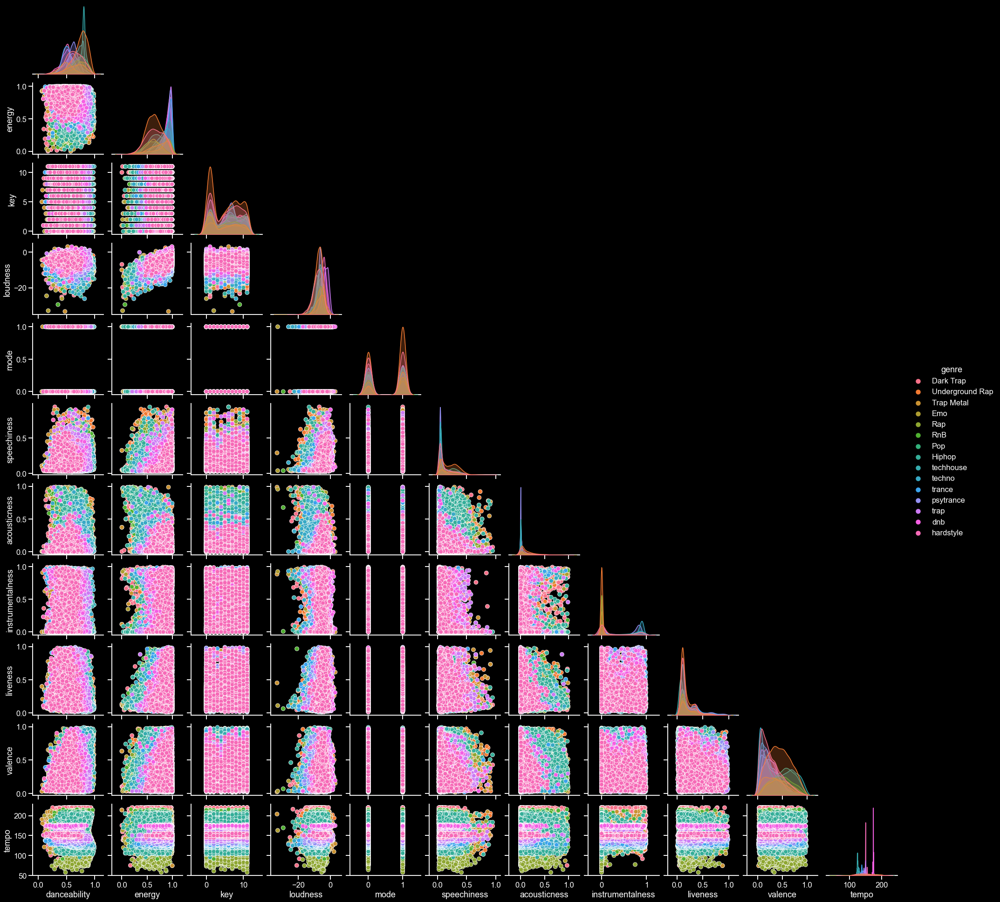

In [7]:
sns.pairplot(df,corner=True,hue='genre')


### Let's have a look at the average time of a song

In [8]:
px.box(data_frame=data,y='duration_ms',color='genre')


### HeatMap of the data

In [9]:
data.drop('Unnamed: 0',axis=1,inplace=True)

In [10]:
x=list(data.corr().columns)
y=list(data.corr().index)
values=np.array(data.corr().values)
fig = go.Figure(data=go.Heatmap(
    z=values,
    x=x,
    y=y,
                   
    
                   hoverongaps = False))
fig.show()

### Clustering Genres with K-Means

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

In [212]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10, n_jobs=-1))])
X = data.select_dtypes(np.number)
cluster_pipeline.fit(X)
data['cluster'] = cluster_pipeline.predict(X)

In [27]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genre'] = data['genre']
projection['cluster'] = data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genre'])
fig.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 21519 samples in 0.313s...
[t-SNE] Computed neighbors for 21519 samples in 23.062s...
[t-SNE] Computed conditional probabilities for sample 1000 / 21519
[t-SNE] Computed conditional probabilities for sample 2000 / 21519
[t-SNE] Computed conditional probabilities for sample 3000 / 21519
[t-SNE] Computed conditional probabilities for sample 4000 / 21519
[t-SNE] Computed conditional probabilities for sample 5000 / 21519
[t-SNE] Computed conditional probabilities for sample 6000 / 21519
[t-SNE] Computed conditional probabilities for sample 7000 / 21519
[t-SNE] Computed conditional probabilities for sample 8000 / 21519
[t-SNE] Computed conditional probabilities for sample 9000 / 21519
[t-SNE] Computed conditional probabilities for sample 10000 / 21519
[t-SNE] Computed conditional probabilities for sample 11000 / 21519
[t-SNE] Computed conditional probabilities for sample 12000 / 21519
[t-SNE] Computed conditional probabilities for sa

### Clustering Songs with K-Means

In [28]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False, n_jobs=4))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [32]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['song_name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

- According to the analysis and visualizations, comparable genres have data points that are close to each other, and similar sorts of songs are likewise clustered together.

- This remark is quite reasonable. Songs in similar genres will sound similar and originate from comparable time periods, and vice versa. We may apply this concept to create a recommendation system by gathering data points from songs that a user has listened to and proposing songs that correlate to adjacent data points.

### Let's Make A Recommendation System

In [11]:
data=data.dropna(subset=['song_name'])

### Need to Preprocess the Data
Question arises why do we need to standardize the data ??

Answer : You see that the data has columns like duration ms whose distance difference can be high causing lot of change in the answer we want every field to contribute the same to the distance (euclidean) hence we have to standardize the data .

In [12]:
# Creating a new dataframe with required features
df=data[data.columns[:11]]
df['genre']=data['genre']
df['time_signature']=data['time_signature']
df['duration_ms']=data['duration_ms']
df['song_name']=data['song_name']

In [13]:
x=df[df.drop(columns=['song_name','genre']).columns].values
scaler = StandardScaler().fit(x)
X_scaled = scaler.transform(x)
df[df.drop(columns=['song_name','genre']).columns]=X_scaled

### Recommendation System Using Euclidean Distance

In [14]:
# This is a function to find the closest song name from the list
def find_word(word,words):
    t=[]
    count=0
    if word[-1]==' ':
        word=word[:-1]
    for i in words:
        if word.lower() in i.lower():
            t.append([len(word)/len(i),count])
        else:
            t.append([0,count])
        count+=1
    t.sort(reverse=True)
    return words[t[0][1]]
        

In [15]:
# Making a weight matrix using euclidean distance
def make_matrix(data,song,number):
    df=pd.DataFrame()
    data.drop_duplicates(inplace=True)
    songs=data['song_name'].values
#    best = difflib.get_close_matches(song,songs,1)[0]
    best=find_word(song,songs)
    print('The song closest to your search is :',best)
    genre=data[data['song_name']==best]['genre'].values[0]
    df=data[data['genre']==genre]
    x=df[df['song_name']==best].drop(columns=['genre','song_name']).values
    if len(x)>1:
        x=x[1]
    song_names=df['song_name'].values
    df.drop(columns=['genre','song_name'],inplace=True)
    df=df.fillna(df.mean())
    p=[]
    count=0
    for i in df.values:
        p.append([distance.euclidean(x,i),count])
        count+=1
    p.sort()
    for i in range(1,number+1):
        print(song_names[p[i][1]])


In [16]:
a=input('Please enter The name of the song :')
b=int(input('Please enter the number of recommendations you want: '))
make_matrix(df,a,b)

Please enter The name of the song :Perfect
Please enter the number of recommendations you want: 10
The song closest to your search is : Perfect
WhatWasThat
Numb
Buss It
drugz
No Flippies
Tears
Thotiana
TheWhiteWitch
Cure
Game V2


### Recommendation System Using Cosine Similarity Distance

In [18]:
def make_matrix_cosine(data,song,number):
    df=pd.DataFrame()
    data.drop_duplicates(inplace=True)
    songs=data['song_name'].values
#    best = difflib.get_close_matches(song,songs,1)[0]
    best=find_word(song,songs)
    print('The song closest to your search is :',best)
    genre=data[data['song_name']==best]['genre'].values[0]
    df=data[data['genre']==genre]
    x=df[df['song_name']==best].drop(columns=['genre','song_name']).values
    if len(x)>1:
        x=x[1]
    song_names=df['song_name'].values
    df.drop(columns=['genre','song_name'],inplace=True)
    df=df.fillna(df.mean())
    p=[]
    count=0
    for i in df.values:
        p.append([distance.cosine(x,i),count])
        count+=1
    p.sort()
    for i in range(1,number+1):
        print(song_names[p[i][1]])

In [20]:
c=input('Please enter The name of the song :')
d=int(input('Please enter the number of recommendations you want: '))
make_matrix_cosine(df,c,d)

Please enter The name of the song :Perfect
Please enter the number of recommendations you want: 9
The song closest to your search is : Perfect
WhatWasThat
drugz
Numb
Buss It
No Flippies
used to it
Tears
Thotiana
Cure


### Making a recommendation System using Correlation Distance

In [21]:
def make_matrix_correlation(data,song,number):
    df=pd.DataFrame()
    data.drop_duplicates(inplace=True)
    songs=data['song_name'].values
#    best = difflib.get_close_matches(song,songs,1)[0]
    best=find_word(song,songs)
    print('The song closest to your search is :',best)
    genre=data[data['song_name']==best]['genre'].values[0]
    df=data[data['genre']==genre]
    x=df[df['song_name']==best].drop(columns=['genre','song_name']).values
    if len(x)>1:
        x=x[1]
    song_names=df['song_name'].values
    df.drop(columns=['genre','song_name'],inplace=True)
    df=df.fillna(df.mean())
    p=[]
    count=0
    for i in df.values:
        p.append([distance.correlation(x,i),count])
        count+=1
    p.sort()
    for i in range(1,number+1):
        print(song_names[p[i][1]])

In [22]:
e=input('Please enter The name of the song :')
f=int(input('Please enter the number of recommendations you want: '))
make_matrix_correlation(df,e,f)

Please enter The name of the song :Perfect
Please enter the number of recommendations you want: 20
The song closest to your search is : Perfect
WhatWasThat
drugz
Buss It
Numb
WhiteLinenSheets
No Flippies
used to it
Tears
Thotiana
But This Is the End
Sig 9
Cure
Okay,ButThisIsTheLastTime
TheWhiteWitch
CharacterSelect (ВыборПерсонажа)
Death Metal
Game V2
Devil Let Go
WhereTheTreesMeetTheFreeway
Macho!


In [ ]:
# give this recommendation system a try and find similar songs

In [ ]:
# now we are going to build a model that will classify songs as similar or not similar based on genre

Random.uniform generates 21081 random numbers (length of our dataset) between 0 and 1. Values less than 0.80 are assigned TRUE(similar) in ‘is_train’ column of the DataFrame

In [174]:
df['is_train'] = np.random.uniform(0,1, len(df)) <= .80

In [175]:
from sklearn.preprocessing import LabelEncoder
columns = ["genre","song_name","is_train"]
le = LabelEncoder()
for col in columns:
    df[col] = le.fit_transform(df[col])

In [176]:
df[["genre", "song_name", "is_train"]]

,genre,song_name,is_train
0,0,8346,1
1,0,9892,1
2,0,12447,1
3,0,10228,1
4,0,13871,0
...,...,...,...
21519,2,5471,1
21520,2,3079,1
21521,2,23,1
21522,2,1871,1


In [177]:
X = df.drop(columns = ["is_train"], axis=1)
y = df["is_train"]

In [178]:
# print the shapes of X and y
# X is our features matrix with 21081 x 15 dimension
print(X.shape)
# y is our response vector with 21081 x 1 dimension
print(y.shape)

(21081, 15)
(21081,)


In [179]:
 #split X and y into training and testing sets
import sklearn 
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=15)

In [180]:
# print the shapes of the new X objects
print(X_train.shape)
print(X_test.shape)

(14756, 15)
(6325, 15)


### Logistic Regression

In [181]:
#train the model on the training set
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [182]:
logreg.score(X_test, y_test)

0.8025296442687747

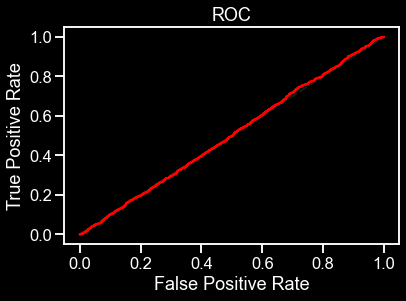

In [184]:
# ROC Curve with logistic regression
from sklearn.metrics import roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
logreg = LogisticRegression()
logreg.fit(X_train,y_train)
y_pred_prob = logreg.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plot ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr,color="red")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()

In [185]:
#GridSearchCV with Logreg
from sklearn.model_selection import GridSearchCV
param_grid = {'C': np.logspace(-3, 3, 7), 'penalty': ['l1', 'l2']}
logreg = LogisticRegression()
logreg_cv = GridSearchCV(logreg,param_grid,cv=3)
logreg_cv.fit(X_train,y_train)
print("Tuned hyperparameters : {}".format(logreg_cv.best_params_))
print("Best Accuracy: {}".format(logreg_cv.best_score_))
##numpy.logspace(start, stop, num=50, endpoint=True, base=10.0, dtype=None, axis=0)

Tuned hyperparameters : {'C': 0.001, 'penalty': 'l2'}
Best Accuracy: 0.7953374420250873


In [205]:
Logistic_score=logreg_cv.best_score_

### K Nearest Neighbor

In [187]:
knn = KNeighborsClassifier(n_neighbors = 10)
knn.fit(X_train,y_train)
prediction = knn.predict(X_test)
print('With KNN (K=3) train accuracy is: ',knn.score(X_train,y_train))
print('With KNN (K=3) test accuracy is: ',knn.score(X_test,y_test))

With KNN (K=3) train accuracy is:  0.7970317159121714
With KNN (K=3) test accuracy is:  0.7813438735177866


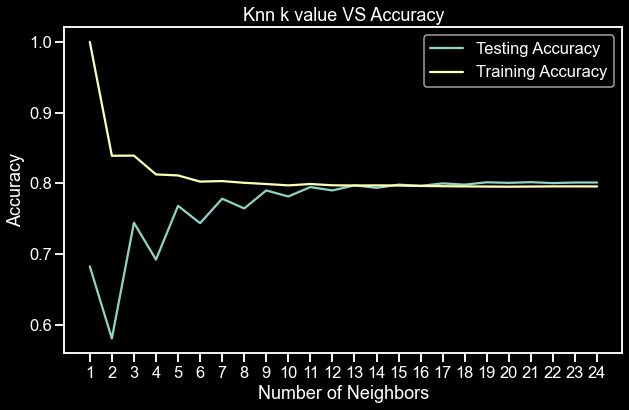

Best accuracy is 0.8015810276679842 with K = 21


In [189]:
neig = np.arange(1, 25)
train_accuracy = []
test_accuracy = []

for i, k in enumerate(neig):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    train_accuracy.append(knn.score(X_train, y_train))
    test_accuracy.append(knn.score(X_test, y_test))

plt.figure(figsize=[10,6])
plt.plot(neig, test_accuracy, label = 'Testing Accuracy')
plt.plot(neig, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.title('Knn k value VS Accuracy')
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.xticks(neig)
plt.savefig('graph.png')
plt.show()
print("Best accuracy is {} with K = {}".format(np.max(test_accuracy),1+test_accuracy.index(np.max(test_accuracy))))

In [191]:
from sklearn.model_selection import GridSearchCV
grid = {'n_neighbors': np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, grid, cv=3) 
knn_cv.fit(X,y)
print("Tuned hyperparameter k: {}".format(knn_cv.best_params_)) 
print("Best accuracy: {}".format(knn_cv.best_score_))

Tuned hyperparameter k: {'n_neighbors': 27}
Best accuracy: 0.7977799914615056


In [203]:
KNN_Score= max(test_accuracy)


### Random forest

In [194]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=150,random_state = 3)
rf.fit(X_train,y_train)
print("Train accuracy of random forest",rf.score(X_train,y_train))
print("Test accuracy of random forest",rf.score(X_test,y_test))
RandomForestClassifier_score=rf.score(X_test,y_test)
y_pred=rf.predict(X_test)
t_true=y_test

Train accuracy of random forest 1.0
Test accuracy of random forest 0.7737549407114624


In [195]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state = 4)
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',cm)
print('Classification report: \n',classification_report(y_test,y_pred))

Confusion matrix: 
 [[  47 1202]
 [ 233 4843]]
Classification report: 
               precision    recall  f1-score   support

           0       0.17      0.04      0.06      1249
           1       0.80      0.95      0.87      5076

    accuracy                           0.77      6325
   macro avg       0.48      0.50      0.47      6325
weighted avg       0.68      0.77      0.71      6325



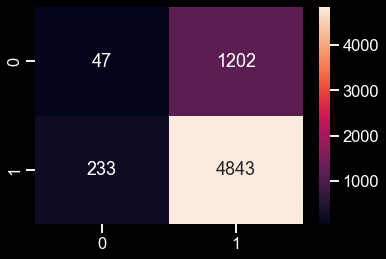

In [196]:
sns.heatmap(cm,annot=True,fmt="d") 
plt.show()

-Since we set our threshold such that 70% of the songs in our dataset are named as similar and 30% are named as non-similar, 70% accuracy can be achieved by predicting all 1s. In order to capture this, we should consider the precision and recall values. As we see in confusion matrix, model predicted “4843 similar” songs and “2596 not-similar” songs correct

### Comparison of model performance

In [206]:
model_performances=pd.DataFrame({'Model':['RandomForestClassifier','K-NearestNeighbors','LogisticRegession'],
                                 'Accuracy':[RandomForestClassifier_score,KNN_Score,Logistic_score]})
model_performances.sort_values(by = "Accuracy",ascending=False)

,Model,Accuracy
1,K-NearestNeighbors,0.801581
2,LogisticRegession,0.795337
0,RandomForestClassifier,0.773755
